# Neural & Behavioral Modeling - Week 8 (Exercises)
by 林子堯 (r08227112@ntu.edu.tw)

In [4]:
%config IPCompleter.greedy=True 
%matplotlib inline
from numpy import *
from matplotlib.pyplot import *
from IPython.display import *

## 1 Simulate attentional effects on neurons (10 points)

Please read the following article:

Reynolds, J. H., & Desimone, R. (1999). <a href=https://www.salk.edu/wp-content/uploads/2015/11/rd.pdf>The role of neural mechanisms of attention in solving the binding problem.</a> Neuron, 24(1), 19-29.

and use its model equations in Fig. 10 to reproduce its Fig. 3a:<br><br>
<img src=https://www.researchgate.net/profile/Richard_Wezel/publication/224015518/figure/fig2/AS:213837023322122@1427994127491/When-presented-with-two-visual-stimuli-simultaneously-attention-can-lead-to-changes-in.png>

Note that the stimulus was presented from 0 to 200ms in the Fig. 3a.

<img src=https://marlin-prod.literatumonline.com/cms/attachment/009cc936-2be0-40e5-9d27-f9902ac4494f/gr10.jpg width="250"/>

In [61]:
s = [False, True]
s[0]/sum(s)

0.0

In [68]:
def competition(s = [True, True], att_on_vertical = False):
    #s = [True, True] # two stimuli [vertical, horizontal] exist
    x = [0.075,0.01] # two potulation intensities
    y = [50] # output neuron inital intensity (base rate)
    #w1_p, w1_m, w2_p, w2_m = 0.8, 0.2, 0.5, 0.2
    dt = 0.01 # delta t for Euler integration
    t = arange(0, 350, dt)
    A, B = 0.015, 200

    w1_p = s[0] / sum(s); w2_p = 1 - w1_p;
    w1_m = w1_p * 0.25; w2_m = w2_p * 0.25
    if att_on_vertical == True:
        w1_p = s[0] / sum(s) * 1.5; w2_p = 1 - w1_p;
        w1_m = w1_p * 0.25; w2_m = w2_p * 0.25
        

    for i in t:
        if i > 200:
            s = [False, False]
        
        x[0] = x[0] * s[0]
        x[1] = x[1] * s[1] 
        
        E = x[0] * w1_p + x[1] * w2_p
        I = x[0] * w1_m + x[1] * w2_m
        y0 = y[-1]
        y1 = y0 + dt * ((B - y0) * E - y0 * I - A * y0) 
        y.append(y1)

    return(y)

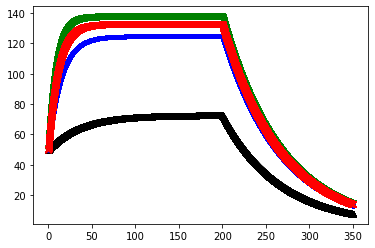

In [70]:
### Write your codes here
y_v = competition(s = [True, False])
y_h = competition(s = [False, True])
y_vh = competition(s = [True, True])
y_Vh = competition(s = [True, True], att_on_vertical = True)
   

plot(t, y_v[0:(-1)], "gv", \
     t, y_h[0:(-1)], "k^", \
     t, y_vh[0:(-1)], "b.", \
     t, y_Vh[0:(-1)], "rx")
